## Регрессия

С 1ого октября отменяется НДС на бриллианты, теперь они становятся новым инвестиционным инструментом. Давайте сделаем модель ценообразования для них.

Скачайте датасет diamonds.csv

В нем представлены характеристики бриллиантов и их цены с сайта jamesallen (B2C площадка) с 2022-07-01

**Описание полей**


* fluor - флуорисценуия (свойство камня светиться в лучах ультр)
* symmetry - показатель симметричности
* platform - название платформы, где был размещен камень
* quality_group - составной показатель из cut polish symmetry
* size_group - каратно весовая группа
* big_size_group - каратно-весовая группа
* shape - форма
* color - цвет
* clarity - чистота
* cut - качество огранки (может быть только у круглых камней)
* polish - полировка
* id - номер камня
* date - дата
* price - цена
* carat - кол-во карат
* tablepercent - размер площадки по отношению ширине
* price_per_carat - цена за карат
* z - длина (diameter)
* x - ширина
* depth_perc - отношение высоты к ширине
* y - высота



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats


%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

path = 'drive/MyDrive/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv(path + '/diamonds.csv', index_col=0)

Необходимо предсказать `price_per_carat`

### Задание 1: Очистка

Не все камни успевают продаться за один месяц, поэтому в таблице есть повторы. Объедините данные по одному камню: подумайте, как лучше это сделать, какую цену брать.

**Попробуйте найти аномалии:** вдруг цена на некоторые камни сильно меняется (то есть продавец сам не знает, по какой цене их продавать). Также убедитесь, что остальные параметры камня не меняются.

In [ ]:
#Начнем с изучения исходных данных датасета
#Нахожу размер через shape
df.shape

(222222, 17)

In [ ]:
#Смотрим исходные названия колонок
df.columns

Index(['fluor', 'symmetry', 'platform', 'shape', 'color', 'clarity', 'cut',
       'polish', 'id', 'date', 'price', 'carat', 'price_per_carat', 'z', 'x',
       'depth_perc', 'y'],
      dtype='object')

In [ ]:
#Посмотрим как выглядят датафрейм в целом
df

,fluor,symmetry,platform,shape,color,clarity,cut,polish,id,date,price,carat,price_per_carat,z,x,depth_perc,y
135269,NONE,EX,jamesallen,PS,F,SI1,NaN,EX,13870838,202206,12850.0,1.55,8290.32,10.29,6.41,62.0,3.97420
48477,MED,EX,jamesallen,RD,H,VVS2,EX,EX,11725253,202207,7510.0,1.02,7362.75,6.41,6.45,62.5,4.03125
236786,NONE,EX,jamesallen,EM,H,IF,NaN,EX,14444347,202205,21220.0,2.01,10557.21,8.60,6.37,65.0,4.14050
235781,NONE,EX,jamesallen,RD,E,VS2,EX,EX,14438434,202207,8660.0,1.00,8660.00,6.39,6.44,61.4,3.95416
277744,NONE,VG,jamesallen,RD,F,VS1,VG,EX,14615276,202206,8480.0,1.00,8480.00,6.28,6.36,62.3,3.96228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20595,NONE,EX,jamesallen,RD,D,VS2,EX,EX,7535786,202207,8700.0,0.97,8969.07,6.36,6.32,62.2,3.93104
282754,NONE,EX,jamesallen,RD,D,VS2,EX,EX,14631732,202206,6650.0,0.90,7388.89,6.13,6.18,61.7,3.81306
141550,NONE,EX,jamesallen,RD,J,SI2,EX,EX,13932645,202205,11570.0,1.52,7611.84,7.36,7.39,61.0,4.50790
71237,STG,EX,jamesallen,RD,G,VS1,EX,EX,12699310,202207,8220.0,1.09,7541.28,6.55,6.60,62.0,4.09200


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 222222 entries, 135269 to 310690
Data columns (total 17 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   fluor            222207 non-null  object 
 1   symmetry         222218 non-null  object 
 2   platform         222218 non-null  object 
 3   shape            222218 non-null  object 
 4   color            222218 non-null  object 
 5   clarity          222218 non-null  object 
 6   cut              148981 non-null  object 
 7   polish           222218 non-null  object 
 8   id               222222 non-null  int64  
 9   date             222222 non-null  int64  
 10  price            222222 non-null  float64
 11  carat            222222 non-null  float64
 12  price_per_carat  222222 non-null  float64
 13  z                222222 non-null  float64
 14  x                222222 non-null  float64
 15  depth_perc       222222 non-null  float64
 16  y                222222 non-null 

In [ ]:
#Смотрим на категориальные признаки (те, что выше были под object)
print(df.fluor.unique())
print(df.symmetry.unique())
print(df.color.unique())
print(df.polish.unique())

['NONE' 'MED' 'FNT' 'STG' nan]
['EX' 'VG' 'G' 'No' nan]
['F' 'H' 'E' 'J' 'D' 'K' 'G' 'I' 'L' 'M' nan]
['EX' 'VG' 'G' nan]


In [ ]:
#Посмотрим на основные показатели датасета, в том числе стандартное отклонение, перцентили и т.д.
df.describe()

,id,date,price,carat,price_per_carat,z,x,depth_perc,y
count,2.222220e+05,222222.000000,2.222220e+05,222222.000000,222222.000000,222222.000000,222222.000000,222222.000000,222222.000000
mean,1.358831e+07,202202.404627,1.171520e+04,1.342990,7034.908535,7.083479,6.423990,64.086827,4.097854
std,2.548511e+06,857.882625,2.540339e+04,0.724063,5216.446801,1.377311,1.046289,4.200656,0.599385
min,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.359865e+07,202205.000000,4.210000e+03,1.000000,4148.510000,6.260000,5.690000,61.800000,3.811500
50%,1.440046e+07,202206.000000,6.560000e+03,1.010000,5851.490000,6.530000,6.380000,63.000000,3.998400
75%,1.483763e+07,202207.000000,1.160000e+04,1.500000,8609.270000,7.660000,6.820000,66.000000,4.322500
max,1.541851e+07,202207.000000,2.380380e+06,21.170000,955000.000000,21.880000,18.050000,78.000000,10.739750


In [ ]:
#создаем столбец, который будет считать необходимые строки
df['count']=df.groupby(['id'])['id'].transform('count')

#Те, что встречались только один раз
df_one=df[df['count']==1]
df_one

,fluor,symmetry,platform,shape,color,clarity,cut,polish,id,date,price,carat,price_per_carat,z,x,depth_perc,y,count
189202,NONE,EX,jamesallen,PS,D,SI2,NaN,EX,14224443,202205,9120.0,1.51,6039.74,10.67,6.23,59.0,3.67570,1
76462,NONE,VG,jamesallen,EM,K,SI2,NaN,VG,12902293,202205,1390.0,0.91,1527.47,6.30,4.58,71.0,3.25180,1
72397,NONE,VG,jamesallen,PS,J,VS1,NaN,VG,12771762,202207,15990.0,2.27,7044.05,11.66,7.26,62.2,4.51572,1
269475,MED,EX,jamesallen,RD,J,SI2,EX,EX,14584509,202205,3700.0,1.01,3663.37,6.37,6.42,62.0,3.98040,1
321928,NONE,EX,jamesallen,RD,G,SI1,EX,EX,14773748,202206,7170.0,1.00,7170.00,6.30,6.35,63.7,4.04495,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438848,NONE,EX,jamesallen,RD,F,IF,EX,EX,15296246,202207,20250.0,1.30,15576.92,7.03,7.08,60.8,4.30464,1
387911,NONE,EX,jamesallen,RD,I,VS2,EX,EX,15037555,202206,8980.0,1.35,6651.85,7.05,7.09,61.7,4.37453,1
165589,STG,G,jamesallen,CUSH,H,SI2,VG,VG,14102502,202205,2970.0,1.01,2940.59,6.12,5.31,71.0,3.77010,1
141550,NONE,EX,jamesallen,RD,J,SI2,EX,EX,13932645,202205,11570.0,1.52,7611.84,7.36,7.39,61.0,4.50790,1


In [ ]:
#Те, что встречались два или три раза
df_three=df[(df['count']==2) | (df['count']==3)]
df_three

,fluor,symmetry,platform,shape,color,clarity,cut,polish,id,date,price,carat,price_per_carat,z,x,depth_perc,y,count
135269,NONE,EX,jamesallen,PS,F,SI1,NaN,EX,13870838,202206,12850.0,1.55,8290.32,10.29,6.41,62.0,3.97420,2
48477,MED,EX,jamesallen,RD,H,VVS2,EX,EX,11725253,202207,7510.0,1.02,7362.75,6.41,6.45,62.5,4.03125,3
236786,NONE,EX,jamesallen,EM,H,IF,NaN,EX,14444347,202205,21220.0,2.01,10557.21,8.60,6.37,65.0,4.14050,2
235781,NONE,EX,jamesallen,RD,E,VS2,EX,EX,14438434,202207,8660.0,1.00,8660.00,6.39,6.44,61.4,3.95416,3
277744,NONE,VG,jamesallen,RD,F,VS1,VG,EX,14615276,202206,8480.0,1.00,8480.00,6.28,6.36,62.3,3.96228,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229133,NONE,EX,jamesallen,RD,I,SI2,EX,EX,14409793,202205,3330.0,0.90,3700.00,6.13,6.18,62.0,3.83160,2
268649,FNT,VG,jamesallen,RD,K,VS1,VG,EX,14581367,202205,3840.0,1.01,3801.98,6.27,6.33,63.0,3.98790,2
20595,NONE,EX,jamesallen,RD,D,VS2,EX,EX,7535786,202207,8700.0,0.97,8969.07,6.36,6.32,62.2,3.93104,2
282754,NONE,EX,jamesallen,RD,D,VS2,EX,EX,14631732,202206,6650.0,0.90,7388.89,6.13,6.18,61.7,3.81306,2


Стандартное отклонение беру для колонок price, carat,	price_per_carat,	z,	x,	depth_perc,	y

брать стандартное отклонение для категориальных признаков, а также дат и номеров камней считаю бессмысленным

In [ ]:
stat = df_three.groupby('id')['price','carat','price_per_carat','z','x','depth_perc','y'].agg(np.std) # Посчитайте стандартное отклонение по нескольким полям,
stat
#  подумайте где оно должно равняться 0, а где меняться в каких-то разумных пределах

<ipython-input-111-7fd59fbc7dca>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  stat = df_three.groupby('id')['price','carat','price_per_carat','z','x','depth_perc','y'].agg(np.std) # Посчитайте стандартное отклонение по нескольким полям,


,price,carat,price_per_carat,z,x,depth_perc,y
id,,,,,,,
19423,334.863156,0.0,318.916742,0.0,0.0,0.404145,0.026835
19449,494.974747,0.0,423.054916,0.0,0.0,0.000000,0.000000
19501,831.384388,0.0,415.692194,0.0,0.0,0.346410,0.027436
19504,0.000000,0.0,0.000000,0.0,0.0,0.212132,0.014213
19505,813.172798,0.0,404.564074,0.0,0.0,0.353553,0.028602
...,...,...,...,...,...,...,...
15409696,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
15410303,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
15410668,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000


Как видно из исследования, стандартное отклонение равно нулю на критериях "карат", и размерах по х и z. В случае с ценой и ценой на карат - она может различаться в зависимости от того, какой высоты наш камень (значение y). Чем он выше отклоняется значение высоты, тем больше и цена за этот камень. Аналогично и с критерием depth_perc, изменяющимся из-за высоты (т.к. сам является отношением высоты к ширине)

При сортировке через фильтацию колаба, я заметила, что у некоторых сандартное отклонение доходит до 56 тысяч

Первым делом удалю выбросы по размерам (по х, по у, по z)

In [ ]:
# удаляем неподходящее по x значения, которые выходят за 25 процентиль и являются выбросами
Q1 = df_three['x'].quantile(0.25)
Q3 = df_three['x'].quantile(0.75)
IQR = Q3 - Q1
df_three[(df_three['x'] < Q1-1.5*IQR ) | (df_three['x'] > Q3+1.5*IQR)]

# удаляем неподходящее по у значения, которые выходят за 25 процентиль и являются выбросами
Q1 = df_three['y'].quantile(0.25)
Q3 = df_three['y'].quantile(0.75)
IQR = Q3 - Q1
df_three[(df_three['y'] < Q1-1.5*IQR ) | (df_three['y'] > Q3+1.5*IQR)]

# удаляем неподходящее по у значения, которые выходят за 25 процентиль и являются выбросами
Q1 = df_three['z'].quantile(0.25)
Q3 = df_three['z'].quantile(0.75)
IQR = Q3 - Q1
df_three[(df_three['z'] < Q1-1.5*IQR ) | (df_three['z'] > Q3+1.5*IQR)]

# Также уберем аномальные значения в цене, которые могут поешать при обучении модели
Q1 = df_three['price'].quantile(0.25)
Q3 = df_three['price'].quantile(0.75)
IQR = Q3 - Q1
df_three[(df_three['price'] < Q1-1.5*IQR ) | (df_three['price'] > Q3+1.5*IQR)]

,fluor,symmetry,platform,shape,color,clarity,cut,polish,id,date,price,carat,price_per_carat,z,x,depth_perc,y,count
2783,NONE,VG,jamesallen,OV,G,VVS2,NaN,VG,234099,202206,55710.0,3.01,18508.31,11.25,7.78,63.8,4.963640,2
302361,MED,EX,jamesallen,EM,I,VVS1,NaN,EX,14700394,202206,24860.0,2.50,9944.00,9.01,6.21,69.9,4.340790,3
100397,FNT,VG,jamesallen,EM,J,SI1,NaN,EX,13375414,202206,23040.0,3.02,7629.14,10.23,6.77,64.9,4.393730,2
125246,NONE,EX,jamesallen,RD,E,VS2,EX,EX,13736357,202207,78030.0,3.01,25923.59,9.14,9.20,62.2,5.722400,2
204675,NONE,EX,jamesallen,RD,G,SI1,EX,EX,14293914,202206,33970.0,2.50,13588.00,8.62,8.66,62.8,5.438479,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12156,NONE,VG,jamesallen,RD,D,VVS2,VG,VG,5627165,202207,52900.0,2.02,26188.12,8.44,8.33,58.4,4.864720,2
22354,NONE,EX,jamesallen,RD,J,SI2,EX,EX,7879399,202207,283530.0,12.10,23432.23,14.85,14.81,60.6,8.974860,2
229733,NONE,EX,jamesallen,PS,H,VS2,NaN,EX,14411519,202206,29470.0,2.40,12279.17,11.71,7.39,60.4,4.463560,2
36063,FNT,VG,jamesallen,RAD,H,VS2,NaN,VG,10537706,202205,73480.0,5.01,14666.67,10.80,8.41,70.0,5.887000,2


In [ ]:
df_three = df_three.query('carat>=15000').sort_values(by=['id','date'])

df_three = df_three.groupby('price').agg('last').reset_index() #тепреь в качестве цены возьмем последнее значение по времени

df = pd.concat([df_one, df_three]).reset_index(drop=True) # соединяем результаты

Цены на бриллианты достаточно сильно меняются, попробуйте вычислить коэффициент инфляции и привести цены к последнему месяцу. Стоит учесть, что цены на все бриллианты не изменяются синхронно, то есть изменение в определенных группах может быть разным.

*Определите эти группы и рассчитайте коэффициенты инфляции для каждой из них. Подправьте цены на эти коэффициенты и создайте новую переменную.*

In [ ]:
categories = ['depth_perc', 'carat', 'price', 'platform'] #определите по каким группам определять инфляцию (к примеру можно добавить каратную группу)

df_index = df.groupby(['date'] + categories)[['price_per_carat']]\
             .mean()\
             .reset_index() # индекс цен

date_max = df_index.date.max()


df_index = df_index.merge(df_index.query('date == @date_max')[categories + ['price_per_carat']]\
                          .rename(columns={'price_per_carat': 'price_per_carat_max'}),
                          on=categories, how='outer') # сопоставляем группы с максимальной датой

df_index['inflation'] = (df_index['price_per_carat_max'] / df_index.price_per_carat)-1 # вычисляем инфляцию

df_with_inf = df.merge(df_index[['date'] + categories + ['inflation']],
                        on=['date'] + categories, how='left') # соединяем все в одной таблице

### Задание 2: Модель

Определите функцию потерь (MSE или MAE) и аргументируйте выбор.
Попробуйте сделать baseline.
Используйте LableEncoder для категориальных фичей и **постройте линейную модель**.

In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import Pipeline

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
df.dropna()


,fluor,symmetry,platform,shape,color,clarity,cut,polish,id,date,price,carat,price_per_carat,z,x,depth_perc,y,count
3,MED,EX,jamesallen,RD,J,SI2,EX,EX,14584509,202205,3700.0,1.01,3663.37,6.37,6.42,62.0,3.98040,1
4,NONE,EX,jamesallen,RD,G,SI1,EX,EX,14773748,202206,7170.0,1.00,7170.00,6.30,6.35,63.7,4.04495,1
8,FNT,EX,jamesallen,PR,F,VS2,EX,EX,15096865,202207,22940.0,2.02,11356.44,6.95,6.92,70.7,4.89244,1
9,STG,EX,jamesallen,RD,J,VS1,EX,VG,14694262,202205,4990.0,1.00,4990.00,6.41,6.46,61.0,3.94060,1
10,NONE,EX,jamesallen,RD,J,SI1,EX,EX,13897961,202205,10210.0,1.74,5867.82,7.59,7.64,62.0,4.73680,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111612,NONE,EX,jamesallen,RD,F,IF,EX,EX,15296246,202207,20250.0,1.30,15576.92,7.03,7.08,60.8,4.30464,1
111613,NONE,EX,jamesallen,RD,I,VS2,EX,EX,15037555,202206,8980.0,1.35,6651.85,7.05,7.09,61.7,4.37453,1
111614,STG,G,jamesallen,CUSH,H,SI2,VG,VG,14102502,202205,2970.0,1.01,2940.59,6.12,5.31,71.0,3.77010,1
111615,NONE,EX,jamesallen,RD,J,SI2,EX,EX,13932645,202205,11570.0,1.52,7611.84,7.36,7.39,61.0,4.50790,1


In [ ]:
#Смотрим чему равны наши категориальные признаки
print(df.fluor.unique())
print(df.symmetry.unique())
print(df.color.unique())
print(df.clarity.unique())
print(df.cut.unique())
print(df.polish.unique())

['NONE' 'MED' 'FNT' 'STG' nan]
['EX' 'VG' 'G' 'No']
['D' 'K' 'J' 'G' 'H' 'F' 'I' 'E' 'M' 'L']
['SI2' 'VS1' 'SI1' 'VS2' 'VVS2' 'VVS1' 'FL' 'I1' 'IF']
[nan 'EX' 'G' 'VG']
['EX' 'VG' 'G']


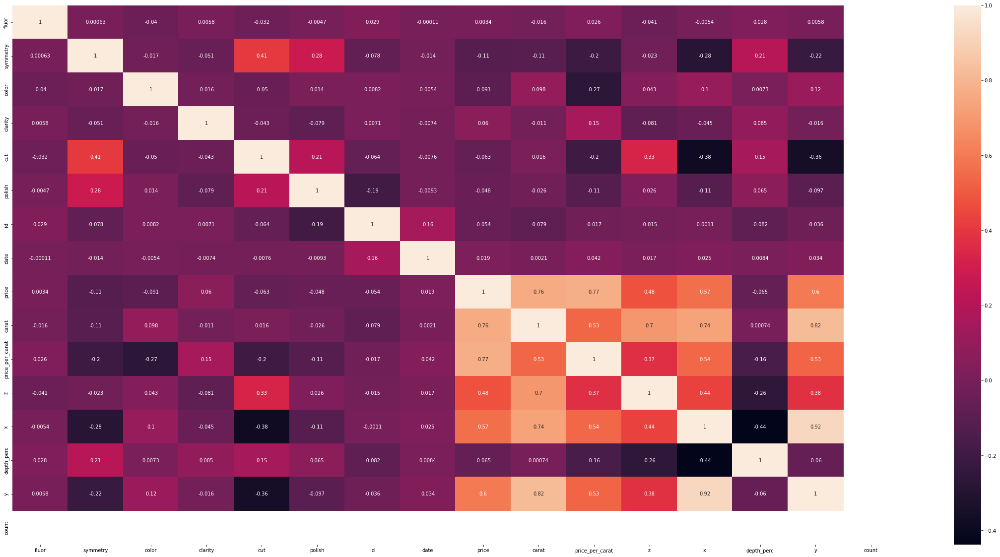

In [ ]:
encoder = LabelEncoder()

#кодируем категор признаки в цифры
df['fluor'] = encoder.fit_transform(df['fluor'])
df['symmetry'] = encoder.fit_transform(df['symmetry'])
df['color'] = encoder.fit_transform(df['color'])
df['clarity'] = encoder.fit_transform(df['clarity'])
df['cut'] = encoder.fit_transform(df['cut'])
df['polish'] = encoder.fit_transform(df['polish'])

#строим корреляционную матрицу

plt.figure(figsize=(40,20))
corr = df.corr()
sns.heatmap(corr, annot=True)

In [ ]:
# проверяем, что это точно числа

print(df.fluor.unique())
print(df.symmetry.unique())
print(df.color.unique())
print(df.clarity.unique())
print(df.cut.unique())
print(df.polish.unique())

[2 1 0 3 4]
[0 3 1 2]
[0 7 6 3 4 2 5 1 9 8]
[4 5 3 6 8 7 0 1 2]
[3 0 1 2]
[0 2 1]


In [ ]:
#Подготавливаем данные

X_train=df.drop(columns="price_per_carat")
y_train=df["price_per_carat"]

X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2)

#посмотрим на размеры тестовых и обучаемых выборок
print('Признаки для обучения', X_train.columns)
print('Размер обучаемого  датасета', X_train.shape)
print('Размер тестового датасета', X_test.shape)

Признаки для обучения Index(['fluor', 'symmetry', 'platform', 'shape', 'color', 'clarity', 'cut',
       'polish', 'id', 'date', 'price', 'carat', 'z', 'x', 'depth_perc', 'y',
       'count'],
      dtype='object')
Размер обучаемого  датасета (89293, 17)
Размер тестового датасета (22324, 17)


In [ ]:
# поделим признаки на численные и категориальные
#Для численных мы исключаем то, что по типу относится к объектам (object)
numeric_columns = X_train.select_dtypes(exclude='object').columns
print(numeric_columns)

#Для категориальных - мы как раз выбираем то, что у нас имеет тип "объект"
categorical_columns = X_train.select_dtypes(include='object').columns
print(categorical_columns)

Index(['fluor', 'symmetry', 'color', 'clarity', 'cut', 'polish', 'id', 'date',
       'price', 'carat', 'z', 'x', 'depth_perc', 'y', 'count'],
      dtype='object')
Index(['platform', 'shape'], dtype='object')


In [ ]:
#Теперь напишем то, что нужно делать для решения задач по признакам (отдельно для чисел и категорий)
#Использую для удобства pipeline, в которой можно прописать всю последовательность выполняемых команд

# С помощью SimpleImputer избавляюсь от пропущенных значений, заменяя их на среднее (медиану)
# для нормировки значений  выбран StandardScaler, который делает значения нормированными и облегчает нам работу с ними
numeric_features = Pipeline([
    ('missing',SimpleImputer(strategy='median')),
    ('scaling',StandardScaler(with_mean=True))])

# OneHotEncoder уже использовался ранее, через него мы делает из категорий (словесных признаков), признаки численные
categorical_features = Pipeline([
    ('missing',SimpleImputer(strategy='most_frequent')),
    ('encoding', OneHotEncoder()),
    ('scaling', StandardScaler(with_mean=False))])

#посмотрим на то, что вышло
print(numeric_features)
print(categorical_features)

# пишу код для преобразования всех категориальных признаков в единую численную базу
processing = ColumnTransformer([
    ('numeric', numeric_features, numeric_columns),
    ('categorical', categorical_features, categorical_columns)])

Pipeline(steps=[('missing', SimpleImputer(strategy='median')),
                ('scaling', StandardScaler())])
Pipeline(steps=[('missing', SimpleImputer(strategy='most_frequent')),
                ('encoding', OneHotEncoder()),
                ('scaling', StandardScaler(with_mean=False))])


In [ ]:
#Пишем функцию, которая сначала будет преобразовывать датасет в численный (то, что выше)
# TruncatedSVD - с помощью него мы настраиваем кол-во компонентов на выходе
# последний шаг - это алгоритм, который мы будем передавать дальше

def for_model(algorithm):
    model = Pipeline(steps= [('processing',processing),
        ('modeling', algorithm)])
    model.fit(X_train, y_train)
    return model

#Расчитываем метрики
def compute_metrics(algo, model):
    print('Алгоритм: '+algo)
    y_predicted = model.predict(X_test)
    #Считаем значения по MAE и по MSE
    mae = mean_absolute_error(y_test, y_predicted)
    mse = mean_squared_error(y_test, y_predicted)
    r2 = r2_score(y_test, y_predicted)

    print("Выборка для теста")
    print('MSE равняется {}'.format(mse))
    print('MAE равняется {}'.format(mae))


In [ ]:
#Пишу функцию, чтобы сравнить ожидание и реальность. На ней

def actual_vs_predicted(algo, model):
    print('Алгоритм: '+algo)

    y_predicted = model.predict(X_test)
    fig, ax = plt.subplots()
    ax.scatter(y_predicted, y_test, edgecolors=(0, 0, 1))
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=3)
    ax.set_xlabel('Ожидание')
    ax.set_ylabel('Реальность')
    plt.show()

In [ ]:
#Собственно, прописываю сами алгоритмы, по которым будут считаться функции
algorithms = [('Linear regression', LinearRegression()),
              ('KNN regression', KNeighborsRegressor()),
              ('Random Forest regression', RandomForestRegressor()),
              ('Gradientboot regression',GradientBoostingRegressor()),
              ('Hist Gradientboost Regressor',HistGradientBoostingRegressor())]

trained_models = []
model_and_score = {}

#прогоняем прописанные выше алгоритмы по всем функциям
for index, tup in enumerate(algorithms):
    model = for_model(tup[1])
    model_and_score[tup[0]] = str(model.score(X_train,y_train)*100)+"%"
    trained_models.append((tup[0],model))

In [ ]:
#Смотрим, что у нас получилось.
#это то, как сработал каждый алгоритм и насколько он "попал" в нужные значения
model_and_score

{'Linear regression': '79.23370924621025%',
 'KNN regression': '78.78556107270158%',
 'Random Forest regression': '95.73522243124111%',
 'Gradientboot regression': '99.17052156402953%',
 'Hist Gradientboost Regressor': '76.2775808716468%'}

Лучше всего показал себя метод Random Forest regression, уровень правильного обучения которого можно оценить на 99.15%. Следом за ним Gradientboot regression с 96.22% и KNN regression с 93.94%

Хуже всего линейная регрессия (Linear regression). Точность этого алгоритма всего лишь 55.47%

*При перезапуске системы меняются данные*

Алгоритм: Linear regression


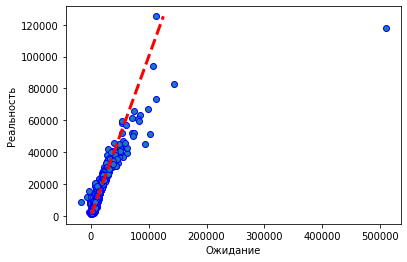

Алгоритм: KNN regression


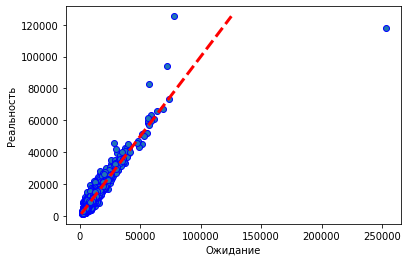

Алгоритм: Random Forest regression


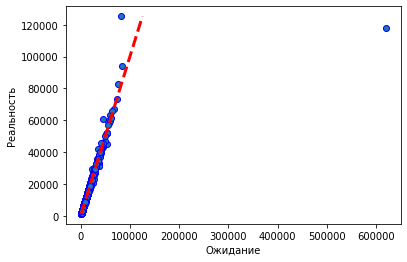

Алгоритм: Gradientboot regression


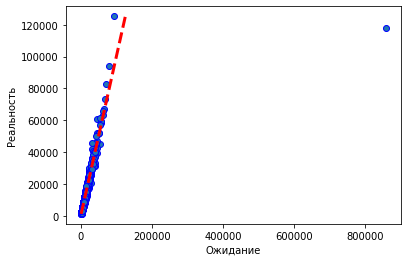

Алгоритм: Hist Gradientboost Regressor


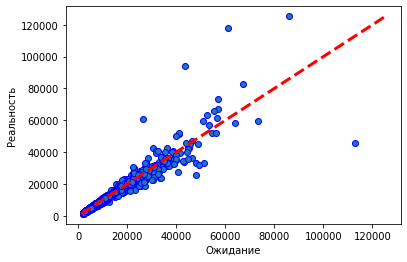

In [ ]:
#Построим графики, чобы убедиться
for index, tup in enumerate(trained_models):
    actual_vs_predicted(tup[0], tup[1])


In [ ]:
for index, tup in enumerate(trained_models):
    compute_metrics(tup[0], tup[1])

Алгоритм: Linear regression
Выборка для теста
MSE равняется 9220021.289489143
MAE равняется 935.3107662929161
Алгоритм: KNN regression
Выборка для теста
MSE равняется 2122275.533630387
MAE равняется 720.4832412650062
Алгоритм: Random Forest regression
Выборка для теста
MSE равняется 11349672.893377708
MAE равняется 45.85347555993616
Алгоритм: Gradientboot regression
Выборка для теста
MSE равняется 24782493.175442785
MAE равняется 341.36766575588547
Алгоритм: Hist Gradientboost Regressor
Выборка для теста
MSE равняется 911413.7129020497
MAE равняется 176.33639464971648


Здесь у нас представлена выборка по MSE (метрика передающая квадратичный корень из средней квадратичной разницы между прогнозируемыми значениями и фактическими значениями в набор данных) и MAE (метрика средней абсолютной разницы между прогнозируемыми значениями и фактическими значениями в наборе данных)

Для обеих метрик - чем они меньше, тем лучше. Поэтому лучше всего себя показывает алоритм Random Forest regression, у которого оба показателя горазддо меньше других

## Классификация

Загрузите датасет bodyPerformance

Описание:

https://www.kaggle.com/datasets/kukuroo3/body-performance-data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

path = 'drive/MyDrive/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv(path + '/bodyPerformance.csv')

In [ ]:
df

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B
...,...,...,...,...,...,...,...,...,...,...,...,...
13388,25.0,M,172.1,71.80,16.2,74.0,141.0,35.8,17.4,47.0,198.0,C
13389,21.0,M,179.7,63.90,12.1,74.0,128.0,33.0,1.1,48.0,167.0,D
13390,39.0,M,177.2,80.50,20.1,78.0,132.0,63.5,16.4,45.0,229.0,A
13391,64.0,F,146.1,57.70,40.4,68.0,121.0,19.3,9.2,0.0,75.0,D


### Задание 1: Определение гендера

Постройте модель, которая будет определять гендер.

Для этого определите две метрики качества, на которые вы будете смотреть. Аргументируйте свой выбор.

После чего преобразуйте категориальные переменные и постройте модель бинарной классификации на основе линейного классификатора и сравните с KNN.

P.S.: не забудте про нормализацию.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
#посмотрим, есть ли нулевые значения (нет данных)
df.isna().sum()

age                        0
gender                     0
height_cm                  0
weight_kg                  0
body fat_%                 0
diastolic                  0
systolic                   0
gripForce                  0
sit and bend forward_cm    0
sit-ups counts             0
broad jump_cm              0
class                      0
dtype: int64

Нулевых нет, так что удалять их сымсла нет. Дубли удалять также не стоит - может быть два похожих человека

In [ ]:
#Теперь надо проверить, сколько категориальных признаков в датасете
df.dtypes

age                        float64
gender                      object
height_cm                  float64
weight_kg                  float64
body fat_%                 float64
diastolic                  float64
systolic                   float64
gripForce                  float64
sit and bend forward_cm    float64
sit-ups counts             float64
broad jump_cm              float64
class                       object
dtype: object

Из категориальных только пол и класс, заменяем признаки через replace

In [ ]:
#Меняем значения для класса
df['class'] = df['class'].replace({"A" : 1,"B" : 2,"C" : 3, "D" : 4})

#Меняем значения для класса
df['gender'] = df['gender'].replace({'M' : 1, 'F' : 0})

#Смотрим что вышло
df

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,1,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,3
1,25.0,1,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,1
2,31.0,1,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,3
3,32.0,1,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,2
4,28.0,1,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
13388,25.0,1,172.1,71.80,16.2,74.0,141.0,35.8,17.4,47.0,198.0,3
13389,21.0,1,179.7,63.90,12.1,74.0,128.0,33.0,1.1,48.0,167.0,4
13390,39.0,1,177.2,80.50,20.1,78.0,132.0,63.5,16.4,45.0,229.0,1
13391,64.0,0,146.1,57.70,40.4,68.0,121.0,19.3,9.2,0.0,75.0,4


Все признаки теперь имеют численные значения. Посмотрим корелляцию

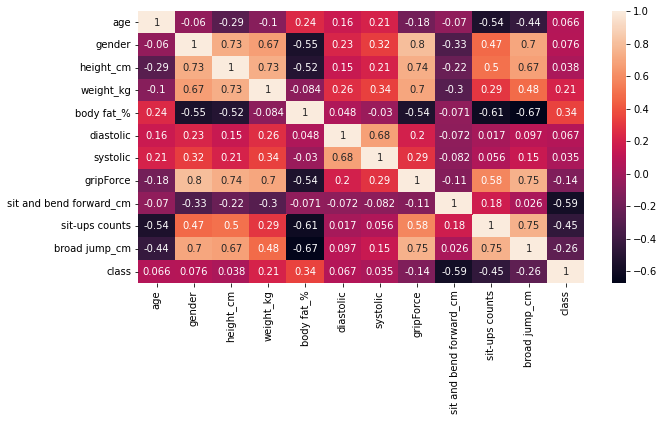

In [ ]:
plt.figure(figsize=(10,5))
sns.heatmap(df.corr(),annot=True)

In [ ]:
#Делаем выборку по полу
y = df['gender']
X = df.drop('gender',axis=1)

X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=13)


#Проводим нормирование критериев
scaler = StandardScaler()
scaler.fit(X_train, y_train)

#расчитываем х-обучаемое и х-тестовое
X_train = pd.DataFrame(scaler.transform(X_train),columns = X_train.columns, index=X_train.index)
X_test = pd.DataFrame(scaler.transform(X_valid), index=X_valid.index,columns=X_valid.columns)


In [ ]:
# Для построение лог регрессии создаем объект через функци LogisticRegression
model_LR = LogisticRegression()

# Обучаем
model_LR.fit(X_train, y_train)

#в итоге получили итоговое предсказание
y_pred_test_LR = model_LR.predict(X_test)
y_pred_train_LR = model_LR.predict(X_train)

print(f"Точность модели составляет: {((y_pred_test_LR == y_valid).sum() / len(y_valid))*100:.2f}%")

Точность модели составляет: 98.99%


Text(0.5, 41.0, 'Прогнозируемые значения')

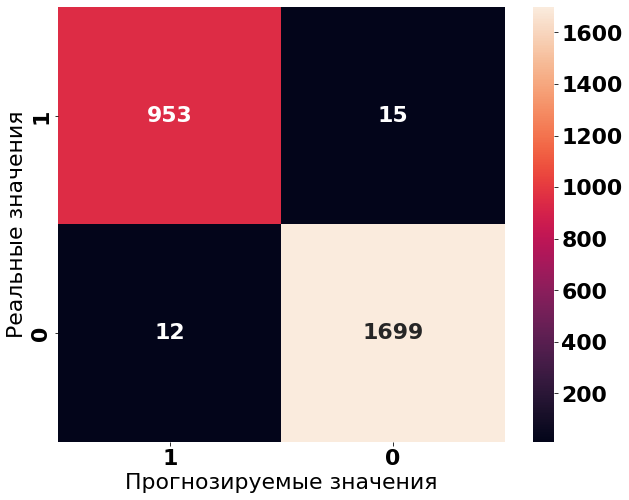

In [ ]:
# Создаем матрицу ошибок
error_matrix_LR = confusion_matrix(y_valid, y_pred_test_LR)
font = {'family' : 'Calibri', 'weight' : 'bold', 'size'   :22}
plt.rc('font', **font)
fig = plt.figure(figsize=(10,8))
sns.heatmap(error_matrix_LR, annot=True, fmt="d",
            xticklabels=df["gender"].unique(),
            yticklabels=df["gender"].unique())
plt.ylabel("Реальные значения")
plt.xlabel("Прогнозируемые значения")

Матрица ошибок показывает, что, ошибочно негативных и ошибочно позитивных значений у нас не так много - 12 и 15. Это хороший показатель.

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

In [ ]:
# Cчитаем по методу accuracy
print(f"TEST:  Accuracy : {accuracy_score(y_valid, y_pred_test_LR)}")
print(f"TRAIN: Accuracy : {accuracy_score(y_train, y_pred_train_LR)}")

# Cчитаем по методу precisiom
print(f"TEST:  Precision : {precision_score(y_valid, y_pred_test_LR)}")
print(f"TRAIN: Precision : {precision_score(y_train, y_pred_train_LR)}")

#Считает методом recall
print(f"TEST:  Recall : {recall_score(y_valid, y_pred_test_LR)}")
print(f"TRAIN: Recall : {recall_score(y_train, y_pred_train_LR)}")

#Считаем по методу f1_score
print(f"TEST KNN:  F1 : {f1_score(y_valid, y_pred_test_LR)}")
print(f"TRAIN KNN: F1 : {f1_score(y_train, y_pred_train_LR)}")

TEST:  Accuracy : 0.9899216125419933
TRAIN: Accuracy : 0.9866529774127311
TEST:  Precision : 0.9912485414235706
TRAIN: Precision : 0.9891995857375352
TEST:  Recall : 0.9929865575686733
TRAIN: Recall : 0.9896388395500296
TEST KNN:  F1 : 0.992116788321168
TRAIN KNN: F1 : 0.9894191638919719


Все показывают примерно одни и те же значения, отличаясь в сотых долях

In [ ]:
# Применяем метод KNeighborsClassifier с числом соседей 3
model_knn = KNeighborsClassifier(n_neighbors=3)

# Обучаем
model_knn.fit(X_train, y_train)

# Получим предсказания для обучающего и тестового датасета
y_pred_train_KNN = model_knn.predict(X_train)
y_pred_test_KNN  = model_knn.predict(X_test)

print(f"TEST:  Accuracy -- {accuracy_score(y_valid, y_pred_test_KNN)}")
print(f"TRAIN: Accuracy -- {accuracy_score(y_train, y_pred_train_KNN)}")

print(f"TEST KNN:  F1 -- {f1_score(y_valid, y_pred_test_KNN)}")
print(f"TRAIN KNN: F1 -- {f1_score(y_train, y_pred_train_KNN)}")

TEST:  Accuracy -- 0.9891750653228817
TRAIN: Accuracy -- 0.9915997759940265
TEST KNN:  F1 -- 0.9915229465068693
TRAIN KNN: F1 -- 0.9933353080568721


Text(0.5, 41.0, 'Прогнозируемые значения')

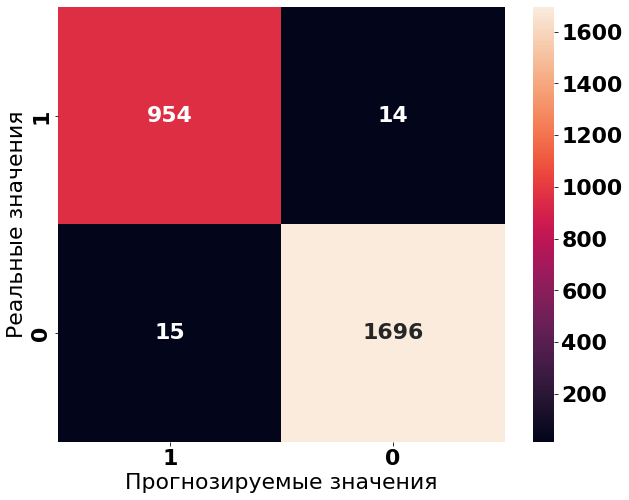

In [ ]:
#Снова посмотрим на матрицу ошибок

mp_mtx = confusion_matrix(y_valid, y_pred_test_KNN)
font = {'family' : 'Calibri', 'weight' : 'bold', 'size'   :22}
plt.rc('font', **font)
fig = plt.figure(figsize=(10,8))
sns.heatmap(mp_mtx, annot=True, fmt="d",
            xticklabels=df["gender"].unique(),
            yticklabels=df["gender"].unique())
plt.ylabel("Реальные значения")
plt.xlabel("Прогнозируемые значения")

У Линейной значения были лучше, здесь неправильно идентифицируемых значений стало на 2 больше.

Смотрим дальше по методу ROC-AUC


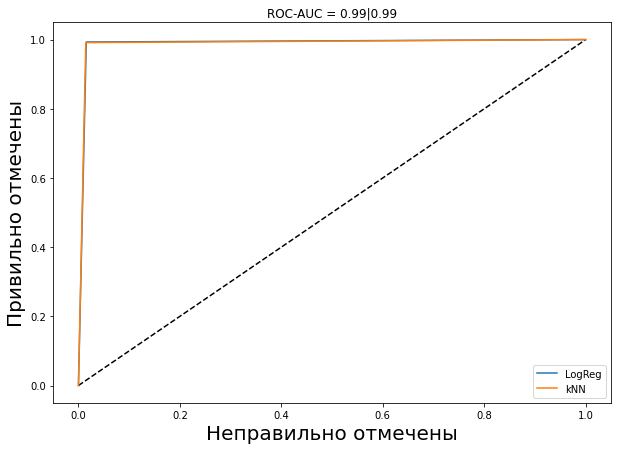

In [ ]:
from sklearn.metrics import roc_curve, auc


fpr_lr, tpr_lr, _ = roc_curve(y_valid, y_pred_test_LR)
fpr_knn, tpr_knn, _ = roc_curve(y_valid, y_pred_test_KNN)

plt.figure(figsize=(10, 7))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_lr, tpr_lr, label="LogReg")
plt.plot(fpr_knn, tpr_knn, label="kNN")
plt.title(f'ROC-AUC = {round(auc(fpr_lr, tpr_lr),2)}|{round(auc(fpr_knn, tpr_knn), 2)}')
plt.ylabel("Привильно отмечены", fontsize=20)
plt.xlabel("Неправильно отмечены", fontsize=20)
plt.legend()
plt.show()

In [ ]:
# Смотрим по положительным. Тестовые делаем по функции predict_proba
y_pred_prob_test_LR = model_LR.predict_proba(X_test)[:, 1]
y_pred_prob_test_KNN = model_knn.predict_proba(X_test)[:, 1]
y_pred_prob_train_LR = model_LR.predict_proba(X_train)[:, 1]
y_pred_prob_train_KNN = model_knn.predict_proba(X_train)[:, 1]

print("Logistic Regression")
print(f"TEST:  ROC-AUC : {roc_auc_score(y_valid, y_pred_prob_test_LR)}")
print(f"TRAIN: ROC-AUC : {roc_auc_score(y_train, y_pred_prob_train_LR)}")
print("kNN")
print(f"TEST:  ROC-AUC : {roc_auc_score(y_valid, y_pred_prob_test_KNN)}")
print(f"TRAIN: ROC-AUC : {roc_auc_score(y_train, y_pred_prob_train_KNN)}")

Logistic Regression
TEST:  ROC-AUC : 0.997130864459912
TRAIN: ROC-AUC : 0.9980609005570928
kNN
TEST:  ROC-AUC : 0.9949805222406307
TRAIN: ROC-AUC : 0.9997226465513709


У логистической регрессии получилась точность выше, несмотря на то, что тестовая была на тысячную меньше тестовой Кнн

### Задание 2: Определение класса

Теперь опробуем построить модель, которая будет предсказывать class физической формы.

Для этого определите метрики качества для задачи мультиклассификации (аргументируйте выбор).

Постройте модель мультиклассовой классификации на основе линейного классификатора и сравните с KNN.

In [ ]:
def process_it(df):
    #Чтобы посмотреть на класс, мы подаем на class на y
    y = df['class']
    X = df.drop('class',axis=1)


    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.2, shuffle=True, random_state=13)

     #Проводим нормирование критериев
    scaler = StandardScaler()
    scaler.fit(X_train)

    X_train = pd.DataFrame(scaler.transform(X_train),columns = X_train.columns, index=X_train.index)
    X_test = pd.DataFrame(scaler.transform(X_valid), index=X_valid.index, columns=X_valid.columns)
    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = process_it(df)

#тренировочная выборка выглядит вот так:
X_train

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- class
Feature names seen at fit time, yet now missing:
- gender

  warnings.warn(message, FutureWarning)


,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
6555,1.043669,0.748129,0.476208,0.796849,-0.423587,0.953853,1.093520,1.386286,0.492556,-0.065998,0.676633
9059,-0.929956,-1.336668,-1.074175,-1.703733,0.358383,0.769218,-0.887606,-0.966104,-0.879083,-1.678476,-1.002814
865,-0.418276,0.748129,0.655099,1.315426,-1.313416,-0.430906,-0.477718,1.675667,0.381940,1.266050,1.403557
12508,-0.783762,0.748129,-0.084315,-0.270513,-1.906634,0.399949,0.000485,0.583486,0.393001,0.915511,1.328358
1114,1.774641,0.748129,-0.096241,0.795170,0.654993,1.046170,1.640037,0.340779,-0.248572,0.214433,0.300637
...,...,...,...,...,...,...,...,...,...,...,...
866,-1.003053,0.748129,-0.203575,-0.673292,-1.825741,-0.984809,-0.614348,0.256765,0.039030,-0.556752,0.526235
10982,-0.564470,-1.336668,-0.668690,-0.564206,1.693126,-1.261761,-1.160865,-0.574039,-0.458742,-0.556752,-1.128146
7696,1.043669,0.748129,-0.060463,-0.001995,0.843744,1.877025,1.571723,-0.387342,-0.326003,0.424757,-0.100425
74,-1.076151,0.748129,0.416578,0.249742,0.169632,-0.800174,-0.819292,-0.051286,-0.569358,0.705188,0.551301


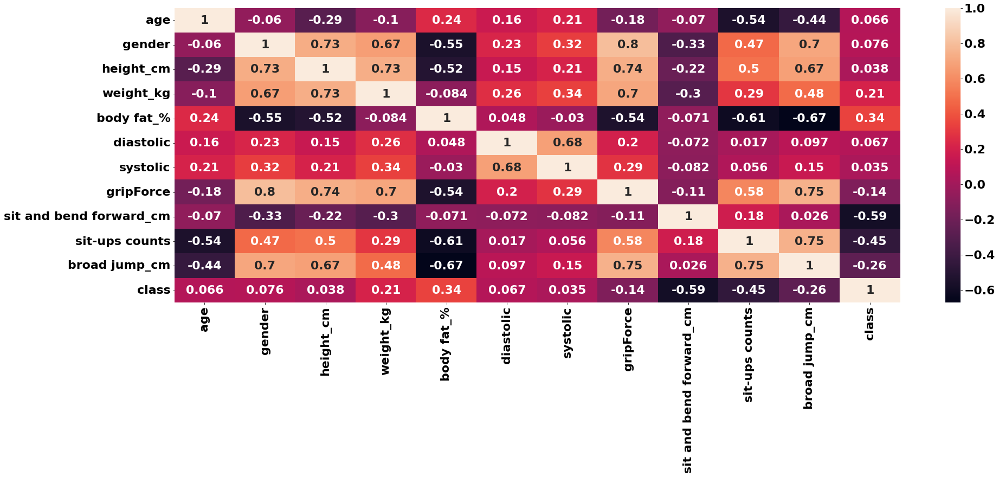

In [ ]:
plt.figure(figsize=(30,10))
sns.heatmap(df.corr(),annot=True)

class
1    AxesSubplot(0.125,0.125;0.775x0.755)
2    AxesSubplot(0.125,0.125;0.775x0.755)
3    AxesSubplot(0.125,0.125;0.775x0.755)
4    AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

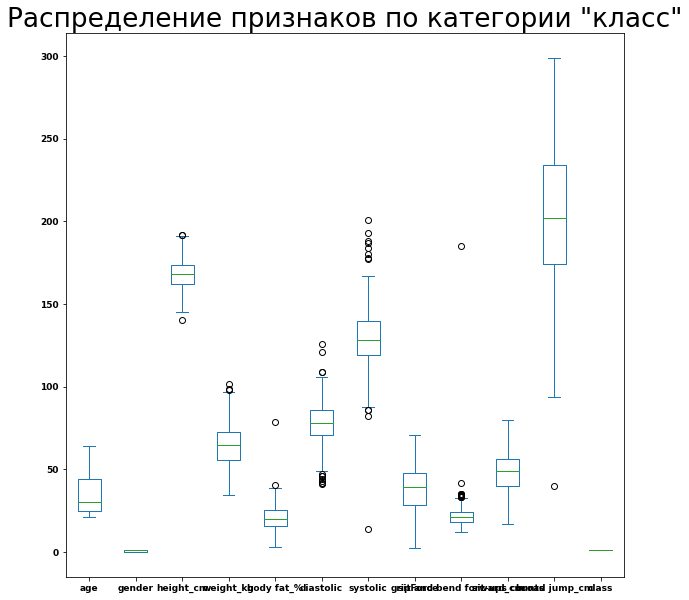

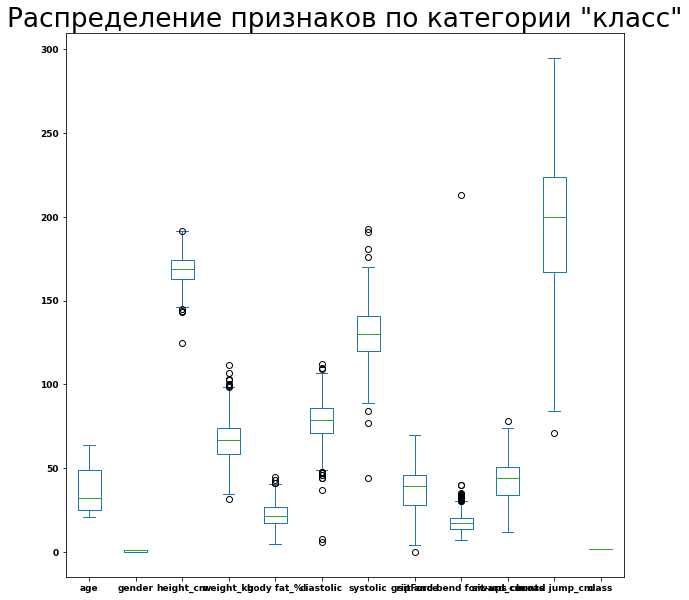

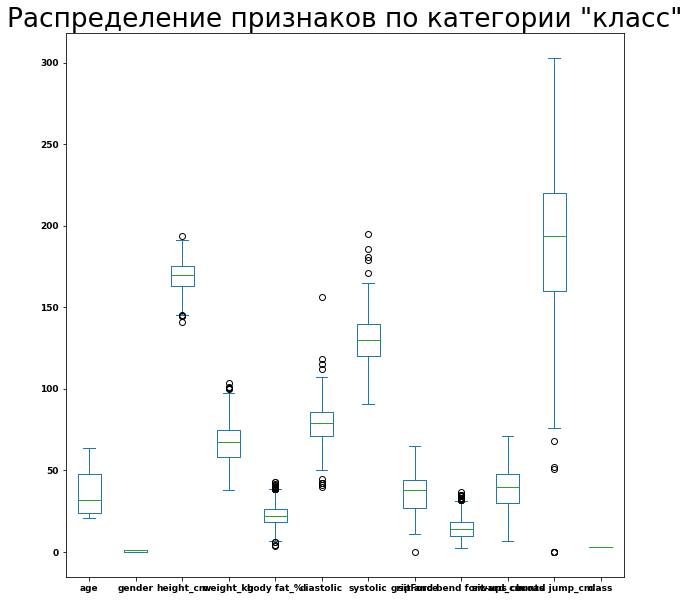

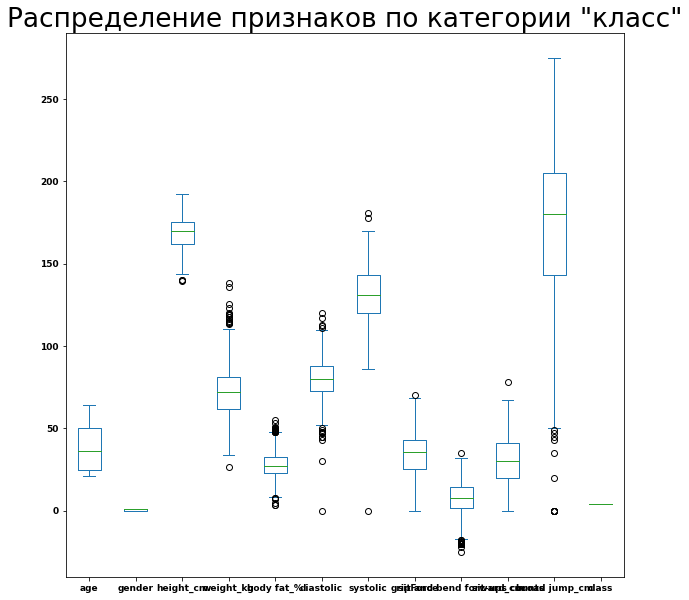

In [ ]:
#Посмотрим на распределение признаков по категории "класс"
group = df.groupby(by ='class')

group.plot(kind="box",
          fontsize=9,
          figsize=(10,10),
          title = 'Распределение признаков по категории "класс"')

По данным графикам мы можем сделать вывод о том,что показатели в каждом классе различны как по средним значениям, так и по количеству выбросов на них

К примеру, если мы возьмем "возраст", то меньше всего буде в классе "а", а больше всего в d. Различаются и медианы (это видно на рисунке)

Посмотрим на корреляцию признаков, чтобы вычленить интересные зависимости


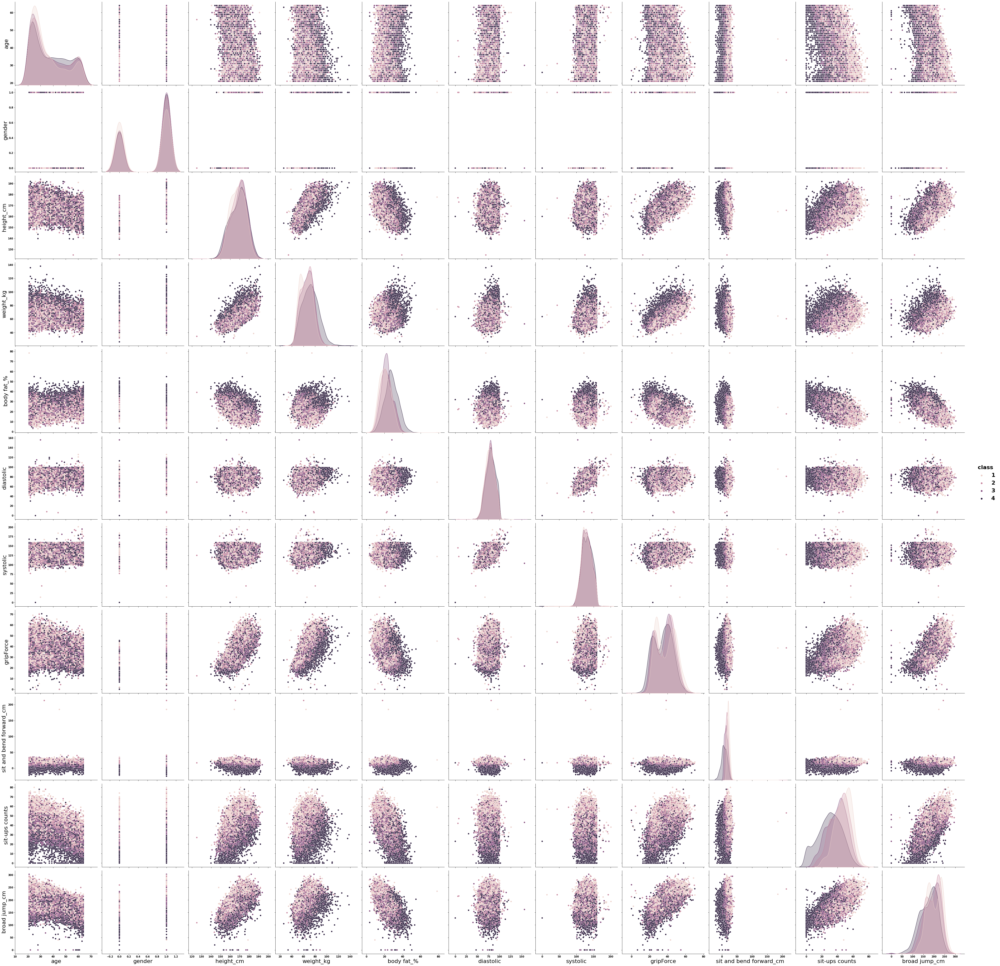

In [ ]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
sns.pairplot(df, height = 5.0, hue="class")

Как и ожидалось, одни признаки хорошо коррелируют, другие совершенно не коррелируют. У пола всего две линии - здесь это из-за того, что полов в принципе всего два. В пределах некоторого диапазона со всеми остальными критериями коррелируется критерий "sit and bend forward"

Совершенно не коррелируют systolic, gripForce, broad_jump

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


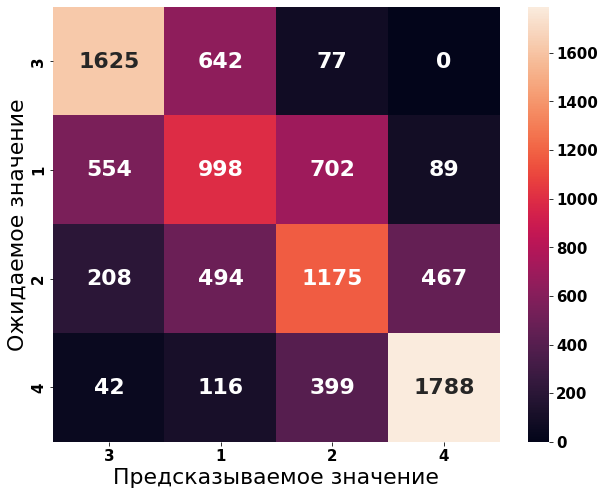

In [ ]:
# Обучим логистическую регрессию
df_lr = LogisticRegression(random_state=13)
df_lr.fit(df_X_train, df_y_train)

#Добавляем предсказания
df_y_lr = df_lr.predict(df_X_test)
df_y_lr_proba = df_lr.predict_proba(df_X_test)

# Построим матрицу ошибок, чтобы понять как справляется наш алгоритм
error_matrix_lr = confusion_matrix(df_y_test, df_y_lr)

fig = plt.figure(figsize=(10,8))
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)
sns.heatmap(error_matrix_lr, annot=True, fmt="d",
            xticklabels=df["class"].unique(),
            yticklabels=df["class"].unique())
plt.ylabel("Ожидаемое значение")
plt.xlabel("Предсказываемое значение")
plt.show()

Ошибочно негативных и ошибочно позитивных стало больше

In [ ]:
# Посмотрим на метрики
print(f"MACRO PRECISION: { precision_score(df_y_test, df_y_lr, average='macro') }")
print(f"MICRO PRECISION: { precision_score(df_y_test, df_y_lr, average='micro')} ")
print(f"weighted PRECISION: { precision_score(df_y_test, df_y_lr, average='weighted') }")


#сразу проверим и метод accuracy
y_pred = df_lr.predict(df_X_test)
score = accuracy_score(df_y_test, df_y_lr)
print('Accuracy')
print(f'TEST LogReg:  Accuracy - {score}')

#а также ROC-AUC
print('ROC-AUC')
print(f"OvO: {roc_auc_score(df_y_test, df_y_lr_proba, multi_class='ovo')}")
print(f"OvR: {roc_auc_score(df_y_test, df_y_lr_proba, multi_class='ovr')}")

MACRO PRECISION: 0.5936790736532224
MICRO PRECISION: 0.5957764505119454 
weighted PRECISION: 0.5937131226164537
Accuracy
TEST LogReg:  Accuracy - 0.5957764505119454
ROC-AUC
OvO: 0.8413898637475978
OvR: 0.8414060742520297


Лучше всего себя показывает метод ROC-AUC, но и от оставляет желать лучшего. У остальных и того хуже, чуть больше 0.5